In [1]:
import warnings

warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install ultralytics  -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.9/626.9 kB 39.2 MB/s eta 0:00:00


In [4]:
!pip install easyocr -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 80.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 72.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 22.0 MB/s eta 0:00:00


In [20]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.image as mpimg
import glob
import requests
from io import BytesIO
import os
from google.colab.patches import cv2_imshow
import easyocr

In [21]:
img_fns = glob.glob('/content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/*.png')

In [22]:
def delete_files(directory):
    file_list = os.listdir(directory)
    for file_name in file_list:
        file_path = os.path.join(directory, file_name)
        if os.path.isfile(file_path):
            os.remove(file_path)
            print(f"Deleted file: {file_name}")


# Predict Using Yolo

In [23]:
model_path = '/content/drive/MyDrive/Yolov8-LicensePlate/result_yolo/2_runs-xml-manual_3_bbox/detect/train/weights/best.pt'
# Load Model
model = YOLO(model_path)

In [24]:
img_fns = glob.glob('/content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/*.png')

## Test for One Image

In [ ]:
# def read_img(images_path):
#     images = [Image.open(image) for image in images_path]
#     # This turns images into (image, scale) tuples temporarily
#     images = [
#         np.asarray(image)
#         for image in images
#     ]
#     return images

In [ ]:
# results = model.predict(img_fns)


0: 640x640 1 first, 1 second, 1 third, 1: 640x640 1 first, 1 second, 1 third, 2: 640x640 1 first, 1 second, 1 third, 3: 640x640 1 first, 1 second, 1 third, 4: 640x640 1 first, 1 second, 1 third, 5: 640x640 2 firsts, 1 second, 1 third, 6: 640x640 1 first, 2 seconds, 7: 640x640 1 second, 2 thirds, 8: 640x640 1 first, 1 second, 1 third, 9: 640x640 1 first, 1 second, 1 third, 10: 640x640 2 seconds, 1 third, 11: 640x640 1 first, 1 second, 1 third, 12: 640x640 1 first, 1 second, 1 third, 13: 640x640 2 seconds, 1 third, 14: 640x640 1 first, 2 seconds, 1 third, 15: 640x640 1 first, 1 second, 1 third, 16: 640x640 1 first, 1 third, 17: 640x640 1 first, 1 second, 1 third, 18: 640x640 1 first, 1 second, 1 third, 19: 640x640 1 first, 1 second, 1 third, 20: 640x640 1 second, 2 thirds, 21: 640x640 1 first, 1 second, 1 third, 22: 640x640 1 first, 1 second, 1 third, 23: 640x640 1 second, 2 thirds, 24: 640x640 1 first, 1 second, 1 third, 25: 640x640 1 first, 1 second, 26: 640x640 2 firsts, 1 second, 27

In [ ]:
# results

In [ ]:
# images = read_img(img_fns)

In [ ]:
# results[89].boxes.data

tensor([[323.8948,  80.1034, 408.1570, 145.9147,   0.8341,   2.0000],
        [129.1597,  36.6964, 300.5894, 118.1842,   0.7489,   1.0000],
        [ 13.4784,   3.0618, 114.3083,  88.5633,   0.5132,   0.0000]], device='cuda:0')

In [ ]:
# results[89].boxes.cpu().numpy()

In [ ]:
# results[5].boxes.cpu().numpy().cls

array([          1,           0,           0,           2], dtype=float32)

In [ ]:
# for i, box in enumerate(results[0].boxes.cpu().numpy()):
#   print(i, box.xyxy[0].astype(int))
#   r = box.xyxy[0].astype(int)
#   print(r[0])

0 [148  12 205  50]
148
1 [ 53  10 131  49]
53
2 [ 5  8 29 49]
5


In [ ]:
class_boxes = {}  # Dictionary to store maximum area and index for each class
boxes = results[5].boxes.cpu().numpy()
for i, box in enumerate(boxes):
    img_class = int(box.cls[0])
    r = box.xyxy[0].astype(int)
    box_area = (r[2] - r[0]) * (r[3] - r[1])

    if img_class not in class_boxes or box_area > class_boxes[img_class][0]:
        class_boxes[img_class] = (box_area, i)

In [ ]:
class_boxes

{1: (5280, 0), 0: (6162, 1), 2: (3476, 3)}

## Multiple Images

In [ ]:
# Buat Hapus Semua Files dalam directory
# directory_path = '/content/drive/MyDrive/Yolov8-LicensePlate/cropped_images_2'
# delete_files(directory_path)

In [25]:
# Predict The Image

save_directory = '/content/drive/MyDrive/Yolov8-LicensePlate/output_predict/cropped_images_4'
FileName = []
filepath = []

orig_filename = []
filename_crop = []
file_class = []

for image_path in img_fns:
  result = model.predict(image_path)
  boxes = result[0].boxes.cpu().numpy()


  class_count = len(boxes.cls)
  if class_count != 0:
    filename = os.path.basename(image_path)
    FileName.append(filename)
    filepath.append(image_path)
    save_path_base = os.path.join(save_directory, filename.split('.')[0])
  else :
    continue

  # Save the cropped Image with custom name
  img = cv2.imread(image_path)
  for i, box in enumerate(boxes):
      r = box.xyxy[0].astype(int)
      crop = img[r[1]:r[3], r[0]:r[2]]
      save_path = f"{save_path_base}_{i+1}.png"
      cropped_filename = f"{filename.split('.')[0]}_{i+1}.png"
      img_class = int(box.cls[0])

      filename_crop.append(cropped_filename)
      file_class.append(img_class)
      orig_filename.append(filename)

      cv2.imwrite(save_path, crop)
      cv2.imwrite(str(i) + ".png", crop)


success_predicted_data = pd.DataFrame({'FilePath' : filepath, 'FileName' : FileName})
cropped_data = pd.DataFrame({'OgFilename' : orig_filename, 'CroppedFilename' : filename_crop, 'class' : file_class})


image 1/1 /content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/DataTest10.png: 256x640 1 first, 1 second, 1 third, 13.1ms
Speed: 1.7ms preprocess, 13.1ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 640)

image 1/1 /content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/DataTest77.png: 192x640 1 first, 1 second, 1 third, 34.9ms
Speed: 2.7ms preprocess, 34.9ms inference, 7.7ms postprocess per image at shape (1, 3, 192, 640)

image 1/1 /content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/DataTest13.png: 224x640 1 first, 1 second, 1 third, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 640)

image 1/1 /content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso/DataTest4.png: 192x640 1 first, 1 second, 1 third, 9.1ms
Speed: 1.4ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 192, 640)

image 1/1 /content/drive/MyDrive/Yolov8-LicensePlate

In [26]:
success_predicted_data.head()

,FilePath,FileName
0,/content/drive/MyDrive/Yolov8-LicensePlate/bg ...,DataTest10.png
1,/content/drive/MyDrive/Yolov8-LicensePlate/bg ...,DataTest77.png
2,/content/drive/MyDrive/Yolov8-LicensePlate/bg ...,DataTest13.png
3,/content/drive/MyDrive/Yolov8-LicensePlate/bg ...,DataTest4.png
4,/content/drive/MyDrive/Yolov8-LicensePlate/bg ...,DataTest63.png


In [27]:
success_predicted_data.shape

(100, 2)

In [28]:
cropped_data.head()

,OgFilename,CroppedFilename,class
0,DataTest10.png,DataTest10_1.png,2
1,DataTest10.png,DataTest10_2.png,1
2,DataTest10.png,DataTest10_3.png,0
3,DataTest77.png,DataTest77_1.png,1
4,DataTest77.png,DataTest77_2.png,2


In [29]:
cropped_data.shape

(303, 3)

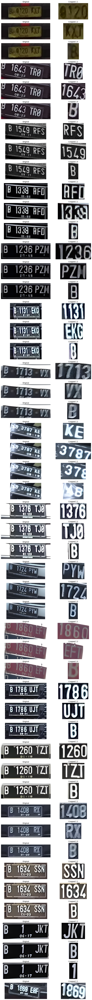

In [31]:
original_images_directory = '/content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso'
cropped_images_directory = '/content/drive/MyDrive/Yolov8-LicensePlate/output_predict/cropped_images_4/'

# Set the start and end index for plotting
start_index = 250
end_index = 260

# Create a figure with 10 rows and 2 columns
fig, axs = plt.subplots(end_index - start_index, 2, figsize=(10, 2 * (end_index - start_index)))

# Iterate over the rows and columns to plot the images
for i, row in cropped_data.iloc[start_index:end_index].iterrows():
    # Load and plot the original image
    original_path = os.path.join(original_images_directory, row['OgFilename'])
    original_image = Image.open(original_path)
    axs[i - start_index, 0].imshow(original_image)
    axs[i - start_index, 0].axis('off')
    axs[i - start_index, 0].set_title('Original')

    # Load and plot the cropped image
    cropped_path = os.path.join(cropped_images_directory, row['CroppedFilename'])
    cropped_image = Image.open(cropped_path)
    cls = row['class']
    axs[i - start_index, 1].imshow(cropped_image)
    axs[i - start_index, 1].axis('off')
    axs[i - start_index, 1].set_title(f'Cropped | {cls}')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Recognize Using PaddleOCR

In [32]:
cropped_data.head(1)

,OgFilename,CroppedFilename,class
0,DataTest10.png,DataTest10_1.png,2


In [33]:
cropped_data['text_result'] = np.nan
cropped_data.head()

,OgFilename,CroppedFilename,class,text_result
0,DataTest10.png,DataTest10_1.png,2,NaN
1,DataTest10.png,DataTest10_2.png,1,NaN
2,DataTest10.png,DataTest10_3.png,0,NaN
3,DataTest77.png,DataTest77_1.png,1,NaN
4,DataTest77.png,DataTest77_2.png,2,NaN


In [34]:
def detect_images(image_path):
  reader = easyocr.Reader(['en'])
  results = reader.readtext(image_path,paragraph="False")
  text = []
  for result in results:
    text.append(result[1])

  return ''.join(text)

### Test 1 image

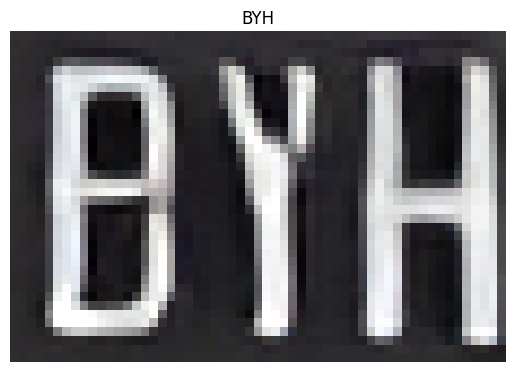

In [ ]:
# Specify the path to the image file
images = "/content/drive/MyDrive/Yolov8-LicensePlate/cropped_images_2/DataTest10_1.png"

# Perform OCR on the image
result = detect_images(images)

img = mpimg.imread(images)
plt.imshow(img)
plt.axis('off')  # Turn off the axis labels
plt.title(result)
plt.show()

## Multiple Images

In [ ]:
# Recognize it
base_dir = '/content/drive/MyDrive/Yolov8-LicensePlate/output_predict/cropped_images_4'
for i, row in cropped_data.iterrows():
  image_path = base_dir + row['CroppedFilename']
  # Perform OCR on the image
  result = detect_images(image_path)
  cropped_data.at[i, 'text_result'] = result

Progress: |██████████████████████████████████████████████----| 92.8% Complete

In [ ]:
recog_successful = cropped_data[~cropped_data.isna().any(axis=1)].reset_index().drop(columns = 'index')

In [ ]:
recog_successful.head()

,OgFilename,CroppedFilename,class,text_result
0,DataTest10.png,DataTest10_1.png,2,BYH
1,DataTest10.png,DataTest10_2.png,1,1736
2,DataTest10.png,DataTest10_3.png,0,A
3,DataTest77.png,DataTest77_1.png,1,15z3
4,DataTest77.png,DataTest77_2.png,2,TJT


In [ ]:
len(recog_successful)

303

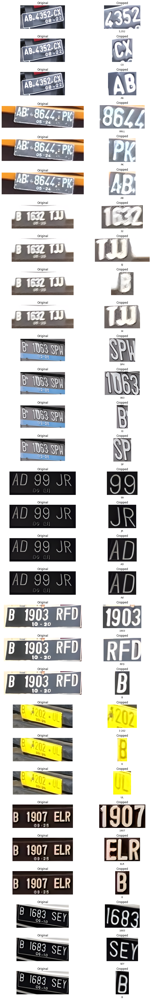

In [ ]:
original_images_directory = '/content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set_highreso'
cropped_images_directory = '/content/drive/MyDrive/Yolov8-LicensePlate/cropped_images_2'

# Set the start and end index for plotting
start_index = 90
end_index = 120

# Create a figure with 10 rows and 2 columns
fig, axs = plt.subplots(end_index - start_index, 2, figsize=(10, 2 * (end_index - start_index)))

# Iterate over the rows and columns to plot the images
for i, row in recog_successful.iloc[start_index:end_index].iterrows():
    # Load and plot the original image
    original_path = os.path.join(original_images_directory, row['OgFilename'])
    original_image = Image.open(original_path)
    axs[i - start_index, 0].imshow(original_image)
    axs[i - start_index, 0].axis('off')
    axs[i - start_index, 0].set_title('Original')

    # Load and plot the cropped image
    cropped_path = os.path.join(cropped_images_directory, row['CroppedFilename'])
    cropped_image = Image.open(cropped_path)
    axs[i - start_index, 1].imshow(cropped_image)
    axs[i - start_index, 1].axis('off')
    axs[i - start_index, 1].set_title('Cropped')

    # Display the text_result below the title
    axs[i - start_index, 1].text(0.5, -0.15, row['text_result'], transform=axs[i - start_index, 1].transAxes,
                                fontsize=10, ha='center')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


# Final Result

In [ ]:
duplicates = cropped_data.duplicated(subset=['OgFilename', 'class'], keep=False)
cropped_data[duplicates]

,OgFilename,CroppedFilename,class,text_result
15,DataTest5.png,DataTest5_1.png,0,
18,DataTest5.png,DataTest5_4.png,0,Au
19,DataTest5.png,DataTest5_5.png,0,
20,DataTest89.png,DataTest89_1.png,1,4 1
22,DataTest89.png,DataTest89_3.png,1,L 18
24,DataTest29.png,DataTest29_2.png,2,
25,DataTest29.png,DataTest29_3.png,2,
33,DataTest28.png,DataTest28_2.png,1,10J6
34,DataTest28.png,DataTest28_3.png,1,
42,DataTest14.png,DataTest14_2.png,1,7 036


In [ ]:
cropped_data.head(10)

,OgFilename,CroppedFilename,class,text_result
0,DataTest10.png,DataTest10_1.png,2,BYH
1,DataTest10.png,DataTest10_2.png,1,1736
2,DataTest10.png,DataTest10_3.png,0,A
3,DataTest77.png,DataTest77_1.png,1,15z3
4,DataTest77.png,DataTest77_2.png,2,TJT
5,DataTest77.png,DataTest77_3.png,0,0
6,DataTest13.png,DataTest13_1.png,1,9313
7,DataTest13.png,DataTest13_2.png,2,SS
8,DataTest13.png,DataTest13_3.png,0,AD
9,DataTest4.png,DataTest4_1.png,1,1661


In [ ]:
cropped_data['result'] = np.where(
    (cropped_data['text_result'].notnull()) &
    (cropped_data['text_result'].str.isalnum()) &
    (cropped_data['kerasocr_result'] != 'b'),
    cropped_data['text_result'],
    cropped_data['kerasocr_result']
)

In [ ]:
cropped_data.head(10)

,OgFilename,CroppedFilename,class,text_result,kerasocr_result,result
0,DataTest10.png,DataTest10_1.png,2,BYH,byh,BYH
1,DataTest10.png,DataTest10_2.png,1,1736,1136,1736
2,DataTest10.png,DataTest10_3.png,0,--,b,b
3,DataTest77.png,DataTest77_1.png,1,1523,1z3,1523
4,DataTest77.png,DataTest77_2.png,2,TJT,tit,TJT
5,DataTest77.png,DataTest77_3.png,0,NaN,b,b
6,DataTest13.png,DataTest13_1.png,1,93,9313,93
7,DataTest13.png,DataTest13_2.png,2,SS,ss,SS
8,DataTest13.png,DataTest13_3.png,0,AD,ad,AD
9,DataTest4.png,DataTest4_1.png,1,1661,1661,1661


In [ ]:
# Sort the DataFrame by 'class' column in ascending order
df_sorted = cropped_data.sort_values('class')

# Group the 'result' values by 'OgFilename' and concatenate them
combined_labels = df_sorted.groupby('OgFilename')['result'].apply(''.join).reset_index()

# Create the 'label' column by combining 'OgFilename' and the combined labels
combined_labels['label'] = combined_labels['result']

# Select the 'OgFilename' and 'label' columns in the final DataFrame
final_df = combined_labels[['OgFilename', 'label']]

In [ ]:
final_df.label = final_df.label.str.upper()
final_df.head()

,OgFilename,label
0,DataTest1.png,7034DE
1,DataTest10.png,B1736BYH
2,DataTest100.png,B1408RY
3,DataTest11.png,BD167BIE
4,DataTest12.png,B1670IZ


# Add the result into The Submission Format

In [ ]:
datatest = pd.read_csv('/content/drive/MyDrive/Yolov8-LicensePlate/bg udh bg/eval_set/DataTest.csv', sep = ";", index_col = 0)
datatest.head()

,Name of File
0,DataTest1.png
1,DataTest2.png
2,DataTest3.png
3,DataTest4.png
4,DataTest5.png


In [ ]:
# Merge final_df with datatest based on 'OgFilename' and 'Name of File'
merged_df = datatest.merge(final_df, left_on='Name of File', right_on='OgFilename', how='left')

# Select the 'Name of File' and 'label' columns from the merged DataFrame
result_df = merged_df[['Name of File', 'label']]
result_df.columns = [['Name of File', 'Vehicleregistrationplatebymodel']]

# Take a look of the result
result_df.head()

,Name of File,Vehicleregistrationplatebymodel
0,DataTest1.png,7034DE
1,DataTest2.png,A9388C
2,DataTest3.png,B163
3,DataTest4.png,B1661CKZ
4,DataTest5.png,V377ABE


In [ ]:
result_df.to_csv('/content/drive/MyDrive/Yolov8-LicensePlate/submission.csv')